In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities, compare_comunity_intersection
from correlations import correlation_industry_pairs, correlation_network_degree,correlation_adjacency_matrix
import seaborn as sns

# Comparison between Flows and Connection algorithms for 2009-2018 matrices 

## Flows


In [2]:
label1 = "Table1_Reduced_matrix_2009_2018_flows"
reduced_matrix_2009_2018 = pd.read_csv("../data/"+label1+".csv", index_col=0)

reduced_matrix_2009_2018_flows = reduced_matrix_2009_2018[reduced_matrix_2009_2018['StartIndst']!=0]

sub_matrix_2009_2018_less1 = reduced_matrix_2009_2018_flows[reduced_matrix_2009_2018_flows['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2009_2018_flows = sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2009_2018_flows.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2018_flows['StartIndst'].values,sub_matrix_2009_2018_flows['FinalIndst'].values])))
sub_matrix_2009_2018_flows[1:15]

Number of links: 287.0
Number of 4-digit industries observed:
170


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
1184,2363,2361,0.999442,Ready-mixed concrete,Concrete products for construction,"Concrete, cement and plaster","Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
1132,2361,2363,0.999184,Concrete products for construction,Ready-mixed concrete,"Concrete, cement and plaster","Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,41.0
1145,4634,1105,0.999042,Beverages,Beer,"Food, beverages, tobacco wholesale",Beverages,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
1196,4761,4763,0.999042,Books,"Music, video recordings",Specialised retail - other,Specialised retail - other,"Wholesale and retail,motor vehicle repair,sale...","Wholesale and retail,motor vehicle repair,sale...",61.0
1127,4671,1920,0.998951,"Fuels, related products",Refined petroleum products,Other wholesale,"Coke, refined petroleum","Wholesale and retail,motor vehicle repair,sale...","Manufacture coke, petroleum, chemicals, pharma...",10.0
1045,1105,4634,0.998684,Beer,Beverages,Beverages,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",53.0
1026,1920,4671,0.998543,Refined petroleum products,"Fuels, related products","Coke, refined petroleum",Other wholesale,"Manufacture coke, petroleum, chemicals, pharma...","Wholesale and retail,motor vehicle repair,sale...",59.0
1198,1013,1011,0.998518,"Meat, poultry meat production","Meat processing, preserving","Food products - meat, fish","Food products - meat, fish","Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",43.0
1178,2829,2825,0.998226,Other,Non-domestic cooling/ventilation eq,General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",44.0
1095,1011,1013,0.997961,"Meat processing, preserving","Meat, poultry meat production","Food products - meat, fish","Food products - meat, fish","Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",10.0


## Connections


In [3]:
label2 = "Table2_Reduced_matrix_2009_2018_connections"
reduced_matrix_2009_2018_conn = pd.read_csv("../data/"+label2+".csv", index_col=0)

reduced_matrix_2009_2018_conn = reduced_matrix_2009_2018_conn[reduced_matrix_2009_2018_conn['StartIndst']!=0]


sub_matrix_2009_2018_conn_less1 = reduced_matrix_2009_2018_conn[reduced_matrix_2009_2018_conn['weight']<1]
sub_matrix_2009_2018_conn = sub_matrix_2009_2018_conn_less1[sub_matrix_2009_2018_conn_less1['weight']>0]

print ("Number of links:", sub_matrix_2009_2018_conn.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2018_conn['StartIndst'].values,sub_matrix_2009_2018_conn['FinalIndst'].values])))

sub_matrix_2009_2018_conn.sort_values(by=['weight'], ascending=False)[1:15]



Number of links: 331.0
Number of 4-digit industries observed:
169


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
1153,2361,2363,0.999405,Concrete products for construction,Ready-mixed concrete,"Concrete, cement and plaster","Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,44.0
1205,4761,4763,0.999241,Books,"Music, video recordings",Specialised retail - other,Specialised retail - other,"Wholesale and retail,motor vehicle repair,sale...","Wholesale and retail,motor vehicle repair,sale...",65.0
1128,4763,4761,0.999241,"Music, video recordings",Books,Specialised retail - other,Specialised retail - other,"Wholesale and retail,motor vehicle repair,sale...","Wholesale and retail,motor vehicle repair,sale...",10.0
1081,1105,4634,0.999112,Beer,Beverages,Beverages,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",54.0
1174,4634,1105,0.999112,Beverages,Beer,"Food, beverages, tobacco wholesale",Beverages,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
1060,1920,4671,0.999010,Refined petroleum products,"Fuels, related products","Coke, refined petroleum",Other wholesale,"Manufacture coke, petroleum, chemicals, pharma...","Wholesale and retail,motor vehicle repair,sale...",61.0
1158,4671,1920,0.999010,"Fuels, related products",Refined petroleum products,Other wholesale,"Coke, refined petroleum","Wholesale and retail,motor vehicle repair,sale...","Manufacture coke, petroleum, chemicals, pharma...",10.0
1139,2825,2829,0.998853,Non-domestic cooling/ventilation eq,Other,General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",10.0
1196,2829,2825,0.998853,Other,Non-domestic cooling/ventilation eq,General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",46.0
1096,1051,4633,0.998512,"Dairies, cheese making",Dairy products,Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",10.0


/Users/crangelsmith/PycharmProjects/KnowledgeFlows/python/labour_flows_matrix/src/correlations.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_industry1['id'] = df_industry1.groupby(['StartIndst', 'FinalIndst']).ngroup()
/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


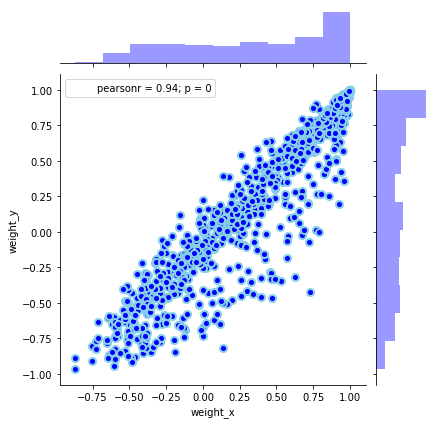

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


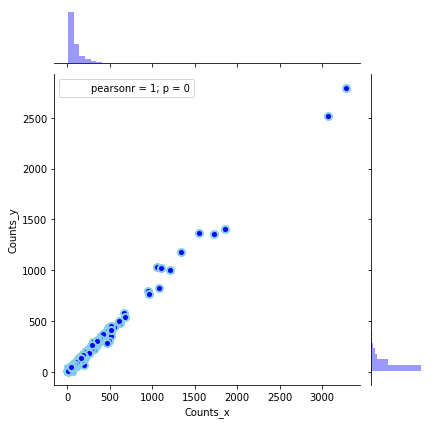

In [4]:
correlation_industry_pairs(sub_matrix_2009_2018_conn_less1,sub_matrix_2009_2018_less1)


correlation_industry_pairs(sub_matrix_2009_2018_conn_less1,sub_matrix_2009_2018_less1,'counts')


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


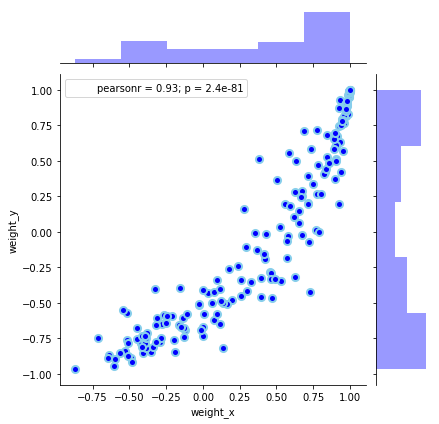

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


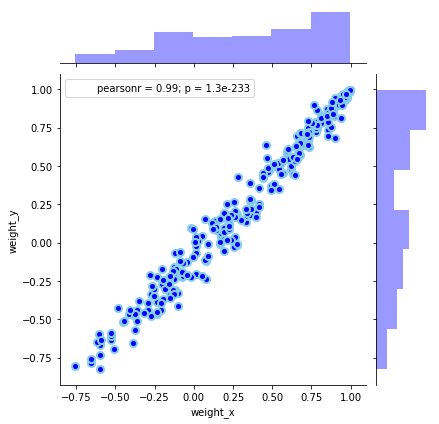

In [5]:
correlation_industry_pairs(sub_matrix_2009_2018_conn_less1[sub_matrix_2009_2018_conn_less1['Counts']<11],sub_matrix_2009_2018_less1,'weight')


correlation_industry_pairs(sub_matrix_2009_2018_conn_less1[sub_matrix_2009_2018_conn_less1['Counts']>100],sub_matrix_2009_2018_less1,'weight')


In [6]:
Gm_simple_2009_2018_flows = build_network_object(reduced_matrix_2009_2018_flows,'weight')
Gm_simple_2009_2018_conn = build_network_object(reduced_matrix_2009_2018_conn,'weight')

## Degree comparison:

NETWORK OF flows


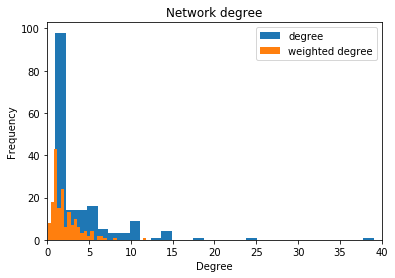

mean degree 3.788235294117647
mean strenght 2.1212519682273556


NETWORK OF connections


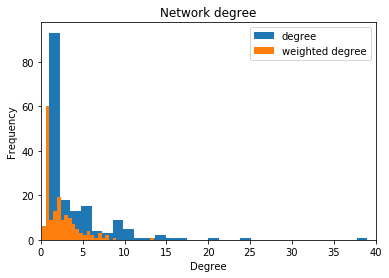

mean degree 3.9171597633136095
mean strenght 2.396754477329774


In [7]:
print ('NETWORK OF flows')
compare_degrees_strength(Gm_simple_2009_2018_flows)
print()
print()
print ('NETWORK OF connections')
compare_degrees_strength(Gm_simple_2009_2018_conn)

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


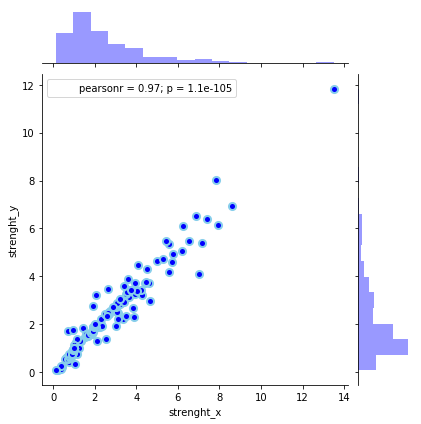

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


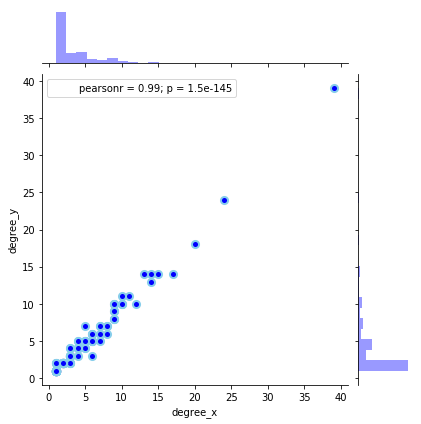

In [8]:
correlation_network_degree(Gm_simple_2009_2018_conn,Gm_simple_2009_2018_flows,'strength')
correlation_network_degree(Gm_simple_2009_2018_conn,Gm_simple_2009_2018_flows,'degree')


## Adjacency matrix:
### Flows:

In [9]:
draw_adjacency_matrix(reduced_matrix_2009_2018_flows,['StartIndst','FinalIndst'],'weight')

### Connections:

In [10]:
draw_adjacency_matrix(reduced_matrix_2009_2018_conn,['StartIndst','FinalIndst'],'weight')

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


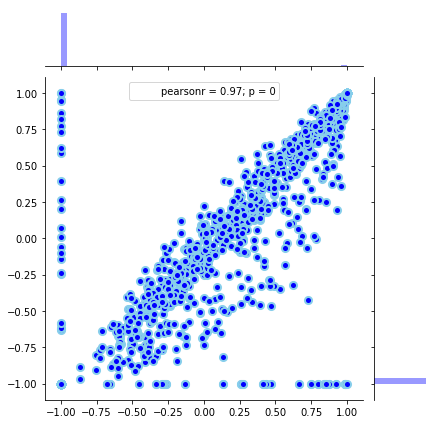

adjacency matrix correlation
(0.9664508124488879, 0.0)
percentage of the entries with non-symetrical missigness
0.10679957280170879


In [11]:
correlation_adjacency_matrix(reduced_matrix_2009_2018_conn,reduced_matrix_2009_2018_flows,'weight')

# Network visualisation: by main industry

im here
im here


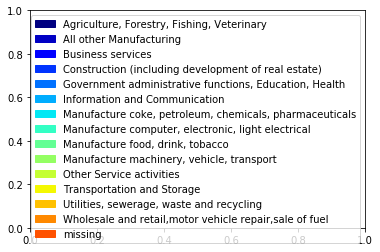

0

In [12]:
draw_network_by_classification(Gm_simple_2009_2018_flows,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2018_flows/network_industry.png)


im here
im here


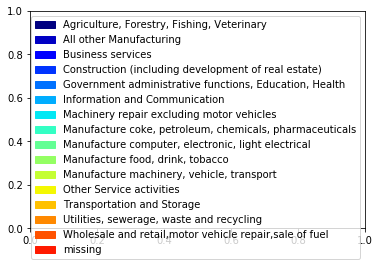

0

In [13]:
draw_network_by_classification(Gm_simple_2009_2018_conn,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2009_2018_flows/network_industry.png)


## Network visualisation: by community
## Flows:

In [14]:
network_components_2009_2018_flows = Gm_simple_2009_2018_flows.components()
network_largest_2009_2018_flows = network_components_2009_2018_flows.subgraphs()[0]


In [15]:
net_community_2009_2018_flows = network_largest_2009_2018_flows.community_multilevel(weights=network_largest_2009_2018_flows.es['weight'])
print ('Modularity',net_community_2009_2018_flows.modularity)

Modularity 0.7184586710829003


In [16]:
list_communities_flows = draw_and_print_communities(network_largest_2009_2018_flows,net_community_2009_2018_flows,'../img/'+label1+'/network_community.png','mainindustry')

Community : 1
['Business services'
 'Government administrative functions, Education, Health'
 'Other Service activities']

Community : 2
['All other Manufacturing' 'Business services'
 'Manufacture food, drink, tobacco'
 'Manufacture machinery, vehicle, transport'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 3
['Information and Communication'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 4
['Business services'
 'Government administrative functions, Education, Health'
 'Manufacture coke, petroleum, chemicals, pharmaceuticals'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 5
['All other Manufacturing' 'Business services'
 'Construction (including development of real estate)'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 6
['Business services' 'Other Service activities']

Community : 7
['Information and Communication'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community

## Connections:



In [17]:
network_components_2009_2018_conn = Gm_simple_2009_2018_conn.components()
network_largest_2009_2018_conn = network_components_2009_2018_conn.subgraphs()[0]
net_community_2009_2018_conn = network_largest_2009_2018_conn.community_multilevel(weights=network_largest_2009_2018_conn.es['weight'])
print ('Modularity',net_community_2009_2018_conn.modularity)

Modularity 0.7041764756888633


In [18]:
list_communities_conn = draw_and_print_communities(network_largest_2009_2018_conn,net_community_2009_2018_conn,'../img/'+label2+'/network_community.png','mainindustry')

Community : 1
['Business services'
 'Government administrative functions, Education, Health'
 'Manufacture coke, petroleum, chemicals, pharmaceuticals'
 'Other Service activities'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 2
['Business services' 'Other Service activities']

Community : 3
['Government administrative functions, Education, Health'
 'Other Service activities']

Community : 4
['All other Manufacturing' 'Business services'
 'Manufacture food, drink, tobacco'
 'Manufacture machinery, vehicle, transport'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 5
['Information and Communication'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 6
['Business services' 'Construction (including development of real estate)'
 'Wholesale and retail,motor vehicle repair,sale of fuel']

Community : 7
['Business services' 'Other Service activities'
 'Utilities, sewerage, waste and recycling']

Community : 8
['Agriculture,

### Flows:

!['something here'](../img/Table1_Reduced_matrix_2009_2018_flows/network_community.png)


### Connections:


![title](../img/Table2_Reduced_matrix_2009_2018_connections/network_community.png)


In [19]:
print (list_communities_conn[1])
print (list_communities_flows[0])

['Business services' 'Other Service activities']
['Business services'
 'Government administrative functions, Education, Health'
 'Other Service activities']


In [20]:
compare_comunity_intersection(list_communities_conn,list_communities_flows,'Connections','Flows')

In [21]:
compare_comunity_intersection(list_communities_flows,list_communities_conn,'Flows','Connections')